### Dataset Loading

In [1]:
import pandas as pd
df = pd.read_csv('Listings.csv',encoding = 'unicode_escape',low_memory=False)


### Exploratory Data Analysis

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 279712 entries, 0 to 279711
Data columns (total 33 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   listing_id                   279712 non-null  int64  
 1   name                         279539 non-null  object 
 2   host_id                      279712 non-null  int64  
 3   host_since                   279547 non-null  object 
 4   host_location                278872 non-null  object 
 5   host_response_time           150930 non-null  object 
 6   host_response_rate           150930 non-null  float64
 7   host_acceptance_rate         166625 non-null  float64
 8   host_is_superhost            279547 non-null  object 
 9   host_total_listings_count    279547 non-null  float64
 10  host_has_profile_pic         279547 non-null  object 
 11  host_identity_verified       279547 non-null  object 
 12  neighbourhood                279712 non-null  object 
 13 

*There are 33 features out of which 14 are object/string type and 19 are numeric.*

In [3]:
df.head(3)

,listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,...,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
0,281420,"Beautiful Flat in le Village Montmartre, Paris",1466919,2011-12-03,"Paris, Ile-de-France, France",NaN,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
1,3705183,39 mÃÂ² Paris (Sacre CÃ âur),10328771,2013-11-29,"Paris, Ile-de-France, France",NaN,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
2,4082273,"Lovely apartment with Terrace, 60m2",19252768,2014-07-31,"Paris, Ile-de-France, France",NaN,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f


In [14]:
#Checking for NULL values
for i in df.columns:
    print("Percentage of NULL values in col->",i," = {:.2f}% \n".format(df[i].isna().sum()/df.shape[0]))

Percentage of NULL values in col-> listing_id  = 0.00% 

Percentage of NULL values in col-> name  = 0.00% 

Percentage of NULL values in col-> host_id  = 0.00% 

Percentage of NULL values in col-> host_since  = 0.00% 

Percentage of NULL values in col-> host_location  = 0.00% 

Percentage of NULL values in col-> host_response_time  = 0.46% 

Percentage of NULL values in col-> host_response_rate  = 0.46% 

Percentage of NULL values in col-> host_acceptance_rate  = 0.40% 

Percentage of NULL values in col-> host_is_superhost  = 0.00% 

Percentage of NULL values in col-> host_total_listings_count  = 0.00% 

Percentage of NULL values in col-> host_has_profile_pic  = 0.00% 

Percentage of NULL values in col-> host_identity_verified  = 0.00% 

Percentage of NULL values in col-> neighbourhood  = 0.00% 

Percentage of NULL values in col-> district  = 0.87% 

Percentage of NULL values in col-> city  = 0.00% 

Percentage of NULL values in col-> latitude  = 0.00% 

Percentage of NULL values in co

**The columns 'host_response_time', 'host_response_rate' & 'host_acceptance_rate' have fairly large no. of null values.**
**Dropping which can cause significant loss of data.**

#### **Checking correlation among feature**
**Solution to Q.2.**

In [16]:
#But before checking relation among the features we need to convert the 'object' columns to numeric so that their 
#affect will also be taken into account.
# Let us first get the list of columns:
df.columns

Index(['listing_id', 'name', 'host_id', 'host_since', 'host_location',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'district', 'city', 'latitude', 'longitude', 'property_type',
       'room_type', 'accommodates', 'bedrooms', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'instant_bookable'],
      dtype='object')

Here, listing_id, name, host_id are columns which nearly have no contribution as they are completely unique values.
Therefore, for simplicity we drop them.

In [17]:
df.drop(['listing_id', 'name', 'host_id'],axis=1,inplace=True)

**Let us now convert an important column that is 'price' in its correct format as the price is in local currency which may lead to ambiguos results.**

In [19]:
df.city.value_counts() #Getting the list of different cities

Paris             64690
New York          37012
Sydney            33630
Rome              27647
Rio de Janeiro    26615
Istanbul          24519
Mexico City       20065
Bangkok           19361
Cape Town         19086
Hong Kong          7087
Name: city, dtype: int64

#### **Note: The following function changes the local currency to INR. All the conversion values are taken from Google on 9th Feb 2023, the latest prices may vary.**

In [20]:
def price_preprocessor(city): #A custom function to change the price
    
    if city == 'Paris':
        return 88.71
    elif city == 'New York' or city == 'Mexico City':
        return 82.69
    elif city == 'Istanbul':
        return 4.39
    elif city == 'Sydney':
        return 57.45
    elif city == 'Rome':
        return 18.11
    elif city == 'Rio de Janeiro':
        return 15.90
    elif city == 'Bangkok':
        return 2.47
    elif city == 'Cape Town':
        return 4.65
    else:
        return 10.51

In [23]:
#Price before:
df[['city','price']]

,city,price
0,Paris,53
1,Paris,120
2,Paris,89
3,Paris,58
4,Paris,60
...,...,...
279707,Paris,120
279708,Paris,60
279709,Paris,50
279710,Paris,105


In [24]:
df['new_price'] = df['city'].apply(price_preprocessor) #We make a new column
df['final_price'] = df['new_price']*df['price']
df.drop(['price','new_price'],axis=1,inplace=True)

#Price after in INR: 
df[['city','final_price']]

,city,final_price
0,Paris,4701.63
1,Paris,10645.20
2,Paris,7895.19
3,Paris,5145.18
4,Paris,5322.60
...,...,...
279707,Paris,10645.20
279708,Paris,5322.60
279709,Paris,4435.50
279710,Paris,9314.55


In [25]:
#Getting room_type values
df.room_type.value_counts()

Entire place    182005
Private room     86988
Hotel room        5857
Shared room       4862
Name: room_type, dtype: int64

In [26]:
#Converting it to numeric type will later help in price prediction
def room_prep(room): #We need to do ordinal encoding
    if room == 'Shared room':
        return 1
    elif room == 'Hotel room':
        return 2
    elif room == 'Private room':
        return 3
    else:
        return 4

df.room_type = df.room_type.apply(room_prep)

In [27]:
#Checking object type columns
df.select_dtypes(include='object').columns

Index(['host_since', 'host_location', 'host_response_time',
       'host_is_superhost', 'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood', 'district', 'city', 'property_type', 'amenities',
       'instant_bookable'],
      dtype='object')

In [ ]:
#Some columns contain binary values, let's tackle them.

#Here, binary columns are:
bin_cols = ['host_is_superhost',
       'host_has_profile_pic', 'host_identity_verified','instant_bookable']

df[bin_cols].dropna(inplace=True)
for i in bin_cols:
    df[i] = df[i].apply(lambda x: 1 if x == 't' else 0)

**Solution to Q.2.**

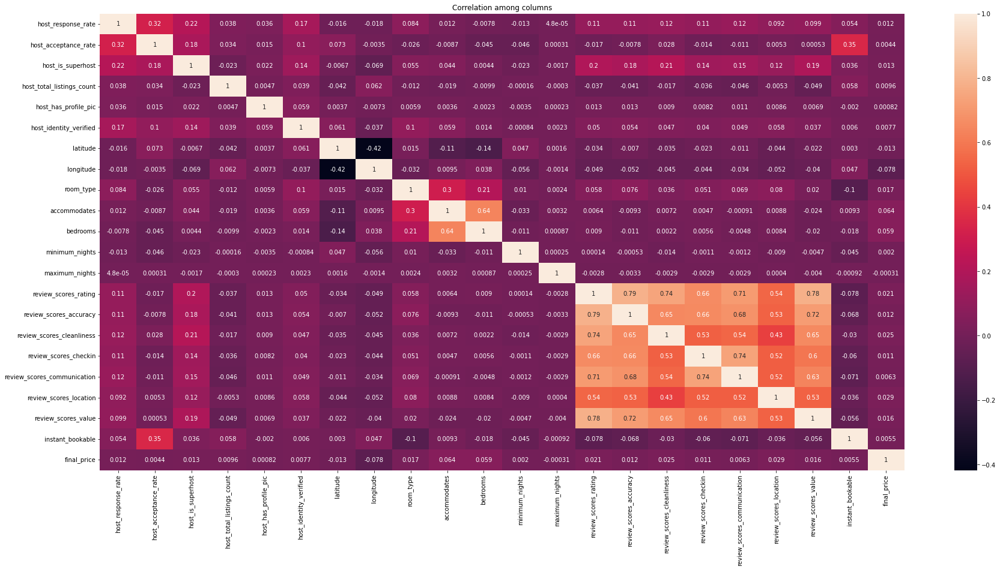

In [29]:
corr_mat = df.corr()
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(30,14))
plt.title("Correlation among columns")
sns.heatmap(corr_mat,annot=True)
plt.show()

#### Plotting the market variation of AirBNB

In [32]:
import plotly.express as px

map_df = df[['city','longitude','latitude']]
fig = px.scatter_mapbox(map_df,lat=map_df.latitude,lon=map_df.longitude,color=map_df.city,width=900,height=600)

In [34]:
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(title_text='AirBNB market variation', title_x=0.5)
fig.show()

### Following things can be done from now on:
**1. Predicting hotel prices.**

**2. Preprocessing the 'amenities' column and generating amenity score.**

**3. More data can be gathered regarding cancellation of bookings to predict cancellation by a customer.**

**4. Customer review can be used for sentiment analysis.**

**5. Ratings of a customer would be a valuable insight.**

In [35]:
df.head(3)

,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,...,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,final_price
0,2011-12-03,"Paris, Ile-de-France, France",NaN,NaN,NaN,0,1.0,1,0,Buttes-Montmartre,...,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,4701.63
1,2013-11-29,"Paris, Ile-de-France, France",NaN,NaN,NaN,0,1.0,1,1,Buttes-Montmartre,...,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,10645.20
2,2014-07-31,"Paris, Ile-de-France, France",NaN,NaN,NaN,0,1.0,1,0,Elysee,...,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,7895.19


### Predicting hotel prices: A Regression based approach

**Data Preprocessing**

In [40]:
#Drop columns which contain more than 40% NULL values:

drop_cols = []
for i in df.columns:
    if (df[i].isna().sum()/df.shape[0]) >= 0.40:
        drop_cols.append(i)
print("Cols to be dropped: ", drop_cols)
df.drop(drop_cols,axis=1,inplace=True)

Cols to be dropped:  ['host_response_time', 'host_response_rate', 'host_acceptance_rate', 'district']


In [41]:
df.head(3)

,host_since,host_location,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,city,latitude,longitude,...,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,final_price
0,2011-12-03,"Paris, Ile-de-France, France",0,1.0,1,0,Buttes-Montmartre,Paris,48.88668,2.33343,...,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,4701.63
1,2013-11-29,"Paris, Ile-de-France, France",0,1.0,1,1,Buttes-Montmartre,Paris,48.88617,2.34515,...,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,10645.20
2,2014-07-31,"Paris, Ile-de-France, France",0,1.0,1,0,Elysee,Paris,48.88112,2.31712,...,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,7895.19


In [44]:
#Filling in NULL values for object dtype
df.select_dtypes(include='object').isna().sum()

host_since       165
host_location    840
neighbourhood      0
city               0
property_type      0
amenities          0
dtype: int64

In [47]:
from sklearn.impute import SimpleImputer

si_obj = SimpleImputer(strategy="most_frequent")
si_num = SimpleImputer(strategy="median")

obj_cols = df.select_dtypes(include='object').columns
num_cols = df.select_dtypes(exclude='object').columns

df[obj_cols] = si_obj.fit_transform(df[obj_cols])
df[num_cols] = si_num.fit_transform(df[num_cols])


#### **We can also calculate the distance between key locations and the host location but for simplicity let's just drop them for now.**

In [50]:
df.select_dtypes(include='object')

,host_since,host_location,neighbourhood,city,property_type,amenities
0,2011-12-03,"Paris, Ile-de-France, France",Buttes-Montmartre,Paris,Entire apartment,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long..."
1,2013-11-29,"Paris, Ile-de-France, France",Buttes-Montmartre,Paris,Entire apartment,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials""..."
2,2014-07-31,"Paris, Ile-de-France, France",Elysee,Paris,Entire apartment,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"",..."
3,2013-12-17,"Paris, Ile-de-France, France",Vaugirard,Paris,Entire apartment,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long ter..."
4,2014-12-14,"Paris, Ile-de-France, France",Passy,Paris,Entire apartment,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Ha..."
...,...,...,...,...,...,...
279707,2015-04-13,"Paris, Ile-de-France, France",Observatoire,Paris,Entire apartment,"[""Iron"", ""Heating"", ""Washer"", ""Dedicated works..."
279708,2013-11-27,"Paris, Ile-de-France, France",Buttes-Montmartre,Paris,Entire apartment,"[""Shampoo"", ""Iron"", ""Heating"", ""Washer"", ""Hair..."
279709,2012-04-27,"Paris, Ile-de-France, France",Buttes-Montmartre,Paris,Entire apartment,"[""Paid parking off premises"", ""Shampoo"", ""Firs..."
279710,2015-07-16,"Paris, Ile-de-France, France",Popincourt,Paris,Entire apartment,"[""TV"", ""Iron"", ""Kitchen"", ""Hangers"", ""Smoke al..."


#### **We convert the 'host_since' column to a valuable feature 'host_since_ndays' by calculating the no. of days a person has been as a host**

In [52]:
df.host_since = pd.to_datetime(df.host_since) #Converting to date time
recent_date = df.host_since.max()

In [53]:
df['host_since_ndays'] = (recent_date - df['host_since']).dt.days

In [58]:
df[['host_since_ndays','host_since']].sort_values(by='host_since') #The values are soted by date

,host_since_ndays,host_since
41688,4581,2008-08-12
245087,4580,2008-08-13
246715,4580,2008-08-13
245800,4580,2008-08-13
244158,4580,2008-08-13
...,...,...
208001,2,2021-02-24
179027,2,2021-02-24
57548,1,2021-02-25
217746,0,2021-02-26


In [59]:
#Now we drop the 'host_since' column along with some other columns
df.drop(['host_since','host_location','neighbourhood','city','property_type'],axis=1,inplace=True)

In [60]:
df

,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,room_type,accommodates,bedrooms,amenities,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,final_price,host_since_ndays
0,0.0,1.0,1.0,0.0,48.88668,2.33343,4.0,2.0,1.0,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long...",...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.0,4701.63,3373
1,0.0,1.0,1.0,1.0,48.88617,2.34515,4.0,2.0,1.0,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials""...",...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.0,10645.20,2646
2,0.0,1.0,1.0,0.0,48.88112,2.31712,4.0,2.0,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"",...",...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.0,7895.19,2402
3,0.0,1.0,1.0,1.0,48.84571,2.30584,4.0,2.0,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long ter...",...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.0,5145.18,2628
4,0.0,1.0,1.0,0.0,48.85500,2.26979,4.0,2.0,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Ha...",...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.0,5322.60,2266
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279707,0.0,1.0,1.0,1.0,48.82701,2.31419,4.0,2.0,1.0,"[""Iron"", ""Heating"", ""Washer"", ""Dedicated works...",...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.0,10645.20,2146
279708,0.0,1.0,1.0,1.0,48.89309,2.33206,4.0,2.0,1.0,"[""Shampoo"", ""Iron"", ""Heating"", ""Washer"", ""Hair...",...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.0,5322.60,2648
279709,0.0,1.0,1.0,1.0,48.88699,2.34920,4.0,2.0,1.0,"[""Paid parking off premises"", ""Shampoo"", ""Firs...",...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.0,4435.50,3227
279710,0.0,1.0,1.0,1.0,48.86687,2.38123,4.0,2.0,1.0,"[""TV"", ""Iron"", ""Kitchen"", ""Hangers"", ""Smoke al...",...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.0,9314.55,2052


**Let us now convert the amenities column into a valuable feature:**

**Our approach would be to calculate the no. of amenities a particular hotel offers.**

**For simplicity wo won't go into the details. We would just take the length of the list as amenity score.**

In [61]:
df.select_dtypes(include='object')

,amenities
0,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long..."
1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials""..."
2,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"",..."
3,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long ter..."
4,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Ha..."
...,...
279707,"[""Iron"", ""Heating"", ""Washer"", ""Dedicated works..."
279708,"[""Shampoo"", ""Iron"", ""Heating"", ""Washer"", ""Hair..."
279709,"[""Paid parking off premises"", ""Shampoo"", ""Firs..."
279710,"[""TV"", ""Iron"", ""Kitchen"", ""Hangers"", ""Smoke al..."


In [89]:
df['amenity_score'] = df['amenities'].apply(lambda x: len(x[1:-1].split(",")))

In [92]:
df[['amenity_score','amenities']].head(3)

,amenity_score,amenities
0,5,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long..."
1,8,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials""..."
2,6,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"",..."


In [ ]:
#Now let us drop our last object type column ,i.e, amenities

df.drop('amenities',axis=1,inplace=True)

In [96]:
df.select_dtypes(include="object").columns #Now all columns are numeric

Index([], dtype='object')

### **Building a simple Linear Regression Model**

In [111]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler

In [98]:
y = df['final_price']
X = df.drop('final_price',axis=1)

In [102]:
ss = StandardScaler()
X = ss.fit_transform(X,y)

In [104]:
X.shape , y.shape

((279712, 21), (279712,))

In [105]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [106]:
X_train.shape, X_test.shape

((223769, 21), (55943, 21))

**Model Training**

In [107]:
lin_reg = LinearRegression()
lin_reg.fit(X_train,y_train)

LinearRegression()

In [110]:
lin_reg.score(X_test,y_test)

0.04420147957356102

#### **We can improve upon our prediction by trying out different models and more preprocessing!**

### Thank you!